In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import scipy
sc.settings.verbosity = 3
sc.logging.print_header()
sc.set_figure_params(dpi=100, dpi_save=600)

import matplotlib.pyplot as pl
from matplotlib import rcParams

import os

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/

scanpy==1.9.3 anndata==0.9.2 umap==0.5.3 numpy==1.24.4 scipy==1.11.1 pandas==2.0.3 scikit-learn==1.3.0 statsmodels==0.14.0 python-igraph==0.10.6 pynndescent==0.5.10


/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()


In [2]:
# use sc.read_10x_mtx() to create an AnnData object into adata. AnnData object can be sliced
# the structure of an AnnData object is introduced in https://anndata.readthedocs.io/en/latest/anndata.AnnData.html, read in depth
WT_1 = sc.read_10x_mtx(
    path='/Users/fengxu/sc-RNA/filtered_feature_bc_matrix_WT_1',  # the directory with the 10X `.mtx` file
    var_names='gene_symbols',                # genes.tsv has gene_ids (ENSGXXXX) and gene_symbols (FAM183A), here sets gene_symbols as index of adata.var
    cache=True)                              # write a cache file for faster subsequent reading
# if use sc.read_10x_mtx(), the 10X 3 output files should be unzipped
# Don't use adata = scv.read(filename='C:/Users/Park_Lab/Documents/Apc_Cracd_IEC.loom', cache=True), Because velocyto.py-generated loom file is a fraction of 10X matrix. It has lower gene counts than 10X matrix (https://github.com/theislab/scvelo/discussions/813). So use 10X matrix as golden standard for Scanpy.

... reading from cache file cache/Users-fengxu-sc-RNA-filtered_feature_bc_matrix_WT_1-matrix.h5ad


In [3]:
# use sc.read_10x_mtx() to create an AnnData object into adata. AnnData object can be sliced
# the structure of an AnnData object is introduced in https://anndata.readthedocs.io/en/latest/anndata.AnnData.html, read in depth
WT_2 = sc.read_10x_mtx(
    path='/Users/fengxu/sc-RNA/filtered_feature_bc_matrix_WT_A',  # the directory with the 10X `.mtx` file
    var_names='gene_symbols',                # genes.tsv has gene_ids (ENSGXXXX) and gene_symbols (FAM183A), here sets gene_symbols as index of adata.var
    cache=True)                              # write a cache file for faster subsequent reading
# if use sc.read_10x_mtx(), the 10X 3 output files should be unzipped
# Don't use adata = scv.read(filename='C:/Users/Park_Lab/Documents/Apc_Cracd_IEC.loom', cache=True), Because velocyto.py-generated loom file is a fraction of 10X matrix. It has lower gene counts than 10X matrix (https://github.com/theislab/scvelo/discussions/813). So use 10X matrix as golden standard for Scanpy.

... reading from cache file cache/Users-fengxu-sc-RNA-filtered_feature_bc_matrix_WT_A-matrix.h5ad


In [4]:
WT_3 = sc.read_10x_mtx(
    path='/Users/fengxu/sc-RNA/filtered_feature_bc_matrix_WT_B', 
    var_names='gene_symbols',cache=True)   

... reading from cache file cache/Users-fengxu-sc-RNA-filtered_feature_bc_matrix_WT_B-matrix.h5ad


In [5]:
Mga_1 = sc.read_10x_mtx(
    path='/Users/fengxu/sc-RNA/filtered_feature_bc_matrix_Mga_1', 
    var_names='gene_symbols',cache=True)  

... reading from cache file cache/Users-fengxu-sc-RNA-filtered_feature_bc_matrix_Mga_1-matrix.h5ad


In [6]:
Mga_2 = sc.read_10x_mtx(
    path='/Users/fengxu/sc-RNA/filtered_feature_bc_matrix_Mga_A', 
    var_names='gene_symbols',cache=True)  

... reading from cache file cache/Users-fengxu-sc-RNA-filtered_feature_bc_matrix_Mga_A-matrix.h5ad


In [7]:
Mga_3 = sc.read_10x_mtx(
    path='/Users/fengxu/sc-RNA/filtered_feature_bc_matrix_Mga_B', 
    var_names='gene_symbols',cache=True)  

... reading from cache file cache/Users-fengxu-sc-RNA-filtered_feature_bc_matrix_Mga_B-matrix.h5ad


In [8]:
WT_1.var_names_make_unique()  # this is unnecessary if var_names='gene_ids'
WT_2.var_names_make_unique()
WT_3.var_names_make_unique()
Mga_1.var_names_make_unique()
Mga_2.var_names_make_unique()
Mga_3.var_names_make_unique()

In [9]:
WT_1,WT_2,WT_3,Mga_1,Mga_2,Mga_3

(AnnData object with n_obs × n_vars = 9577 × 32285
     var: 'gene_ids', 'feature_types',
 AnnData object with n_obs × n_vars = 11634 × 32285
     var: 'gene_ids', 'feature_types',
 AnnData object with n_obs × n_vars = 10316 × 32285
     var: 'gene_ids', 'feature_types',
 AnnData object with n_obs × n_vars = 9633 × 32285
     var: 'gene_ids', 'feature_types',
 AnnData object with n_obs × n_vars = 7772 × 32285
     var: 'gene_ids', 'feature_types',
 AnnData object with n_obs × n_vars = 10075 × 32285
     var: 'gene_ids', 'feature_types')

In [10]:
adata = WT_1.concatenate(WT_2,WT_3,Mga_1,Mga_2,Mga_3, batch_categories=['WT_1','WT_2','WT_3','Mga_1','Mga_2','Mga_3'])
adata

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/anndata/_core/anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


AnnData object with n_obs × n_vars = 59007 × 32285
    obs: 'batch'
    var: 'gene_ids', 'feature_types'

In [11]:
adata.write('/Users/fengxu/sc-RNA/WT_Mga_raw.h5ad', compression='gzip')

In [12]:
adata=sc.read('/Users/fengxu/sc-RNA/WT_Mga_raw.h5ad')

normalizing counts per cell
    finished (0:00:00)


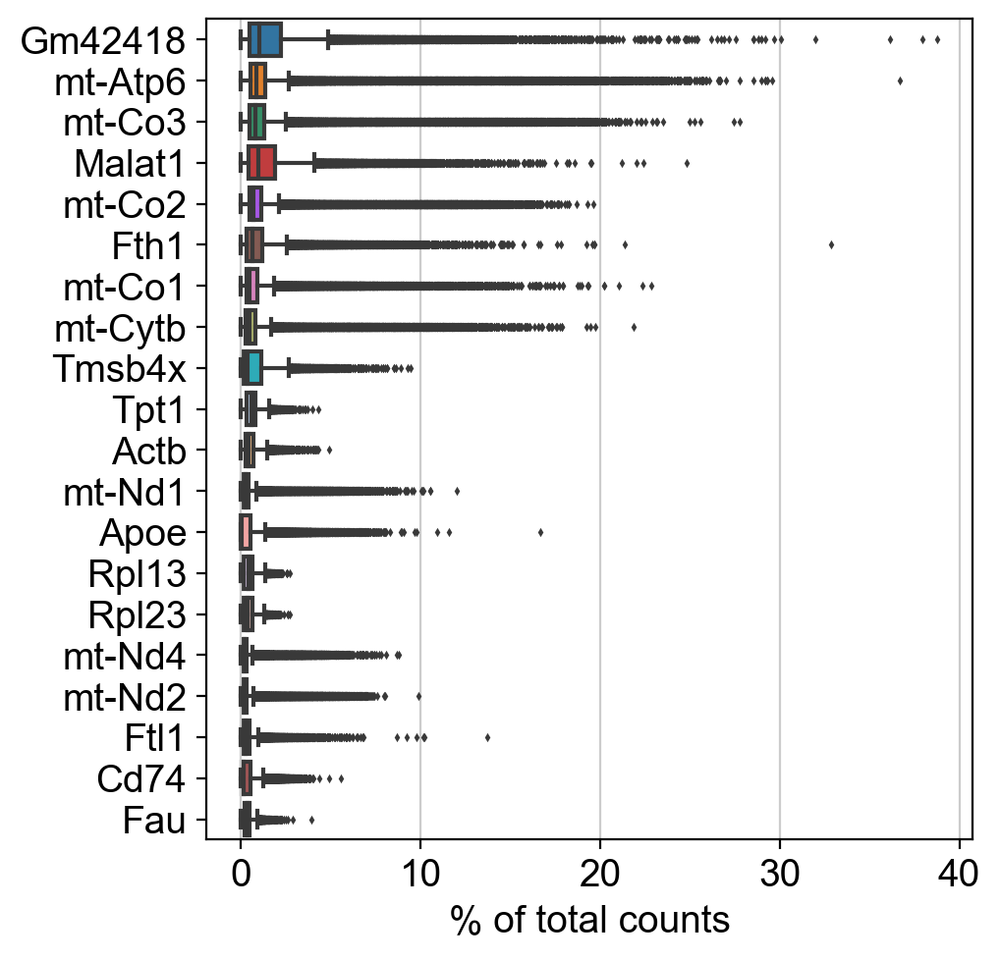

filtered out 655 cells that have less than 200 genes expressed
filtered out 11333 genes that are detected in less than 20 cells


AnnData object with n_obs × n_vars = 58352 × 20952
    obs: 'batch', 'n_genes'
    var: 'gene_ids', 'feature_types', 'n_cells'

In [13]:
sc.pl.highest_expr_genes(adata, n_top=20)
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=20)
adata

In [14]:
adata.var['mt'] = adata.var_names.str.startswith('mt-')
adata.var['rpl'] = adata.var_names.str.startswith('Rpl')
adata.var['rps'] = adata.var_names.str.startswith('Rps')
adata

AnnData object with n_obs × n_vars = 58352 × 20952
    obs: 'batch', 'n_genes'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps'

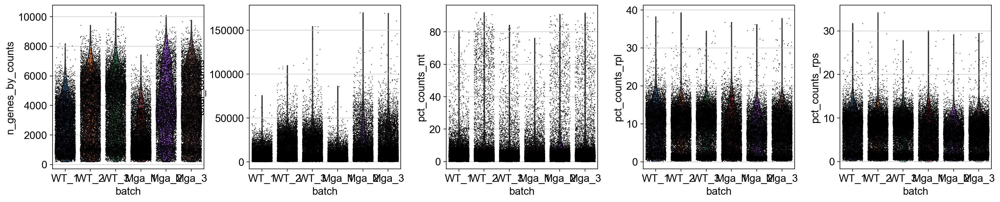

AnnData object with n_obs × n_vars = 58352 × 20952
    obs: 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'batch_colors'

In [15]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','rpl','rps'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, keys=['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_rpl','pct_counts_rps'], jitter=0.4, groupby = 'batch',multi_panel=True)
adata

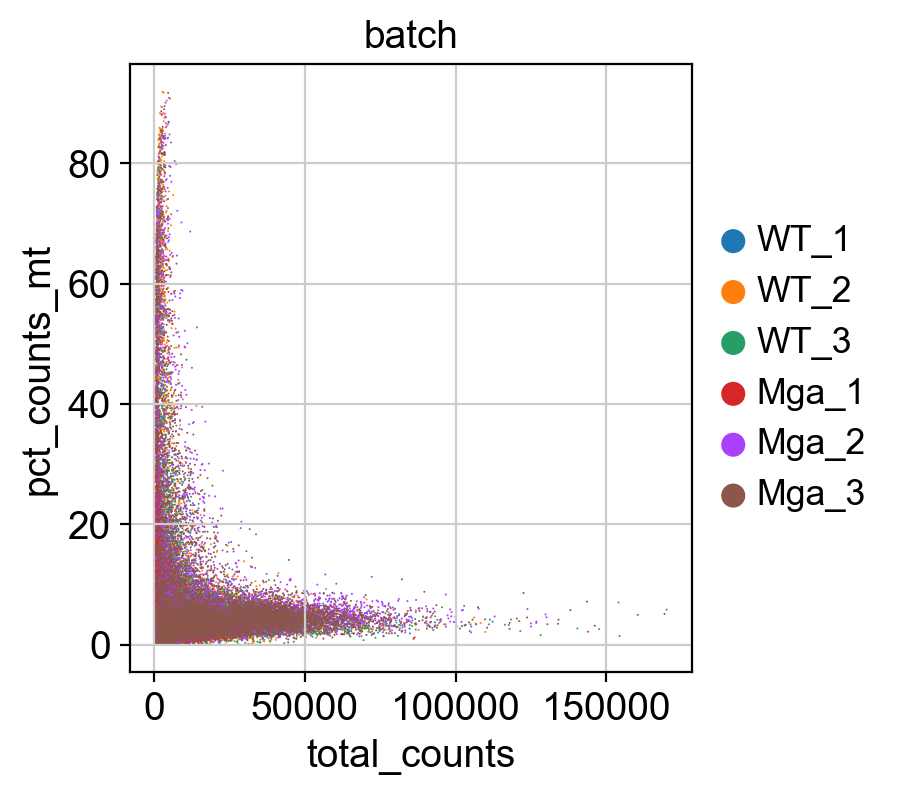

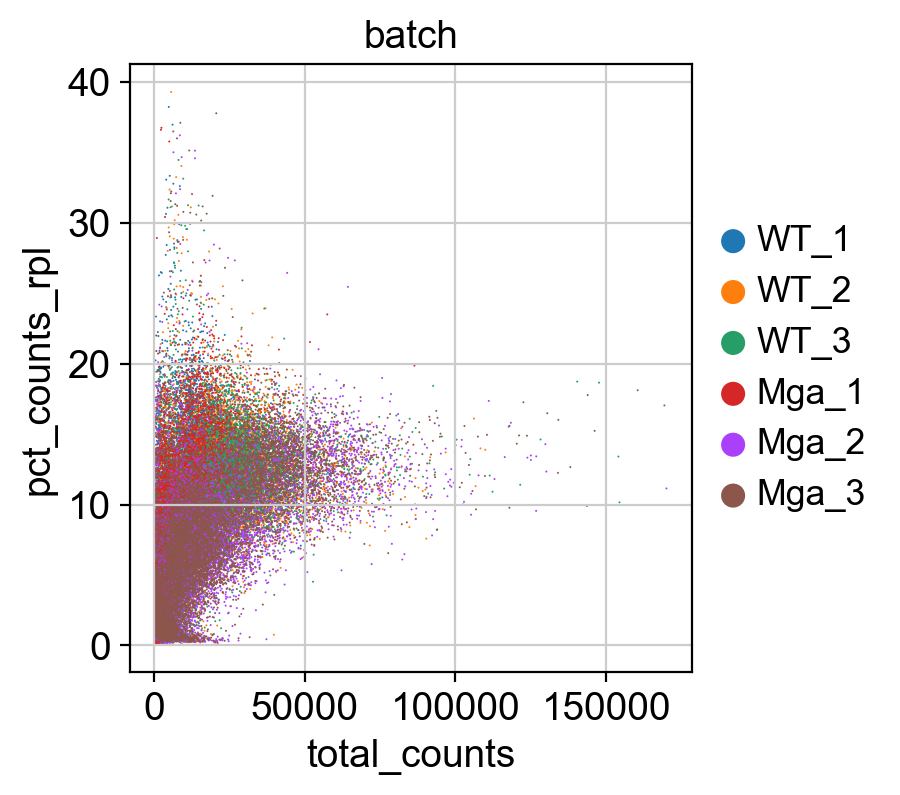

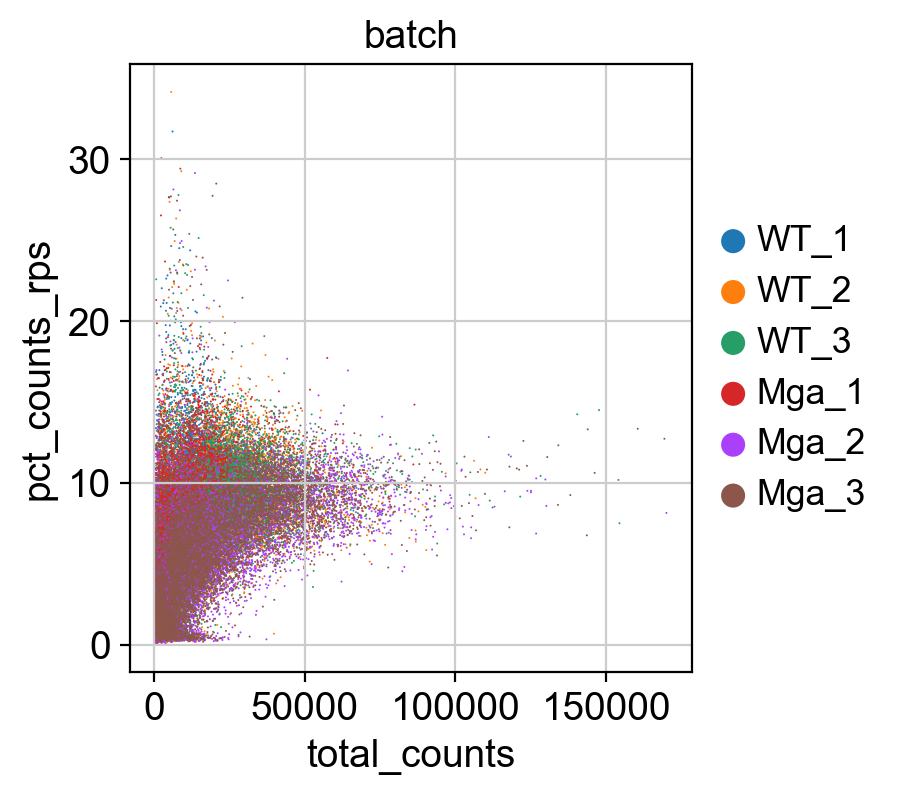

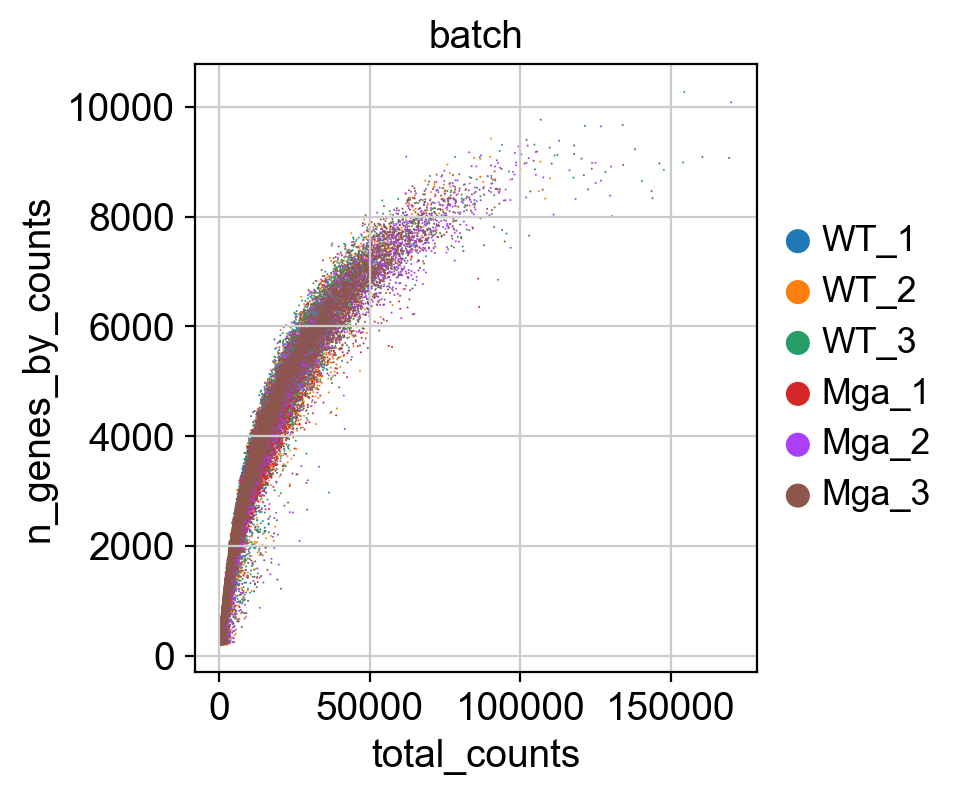

In [16]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="batch")
sc.pl.scatter(adata, x='total_counts', y='pct_counts_rpl', color="batch")
sc.pl.scatter(adata, x='total_counts', y='pct_counts_rps', color="batch")
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="batch")

In [17]:
adata = adata[adata.obs.n_genes_by_counts < 10000, :]
adata = adata[adata.obs.pct_counts_mt < 20, :]
adata = adata[adata.obs.pct_counts_rpl < 20, :]
adata = adata[adata.obs.pct_counts_rps < 15, :]
adata

View of AnnData object with n_obs × n_vars = 53548 × 20952
    obs: 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'batch_colors'

In [18]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


AnnData object with n_obs × n_vars = 53548 × 20952
    obs: 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'batch_colors', 'log1p'

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


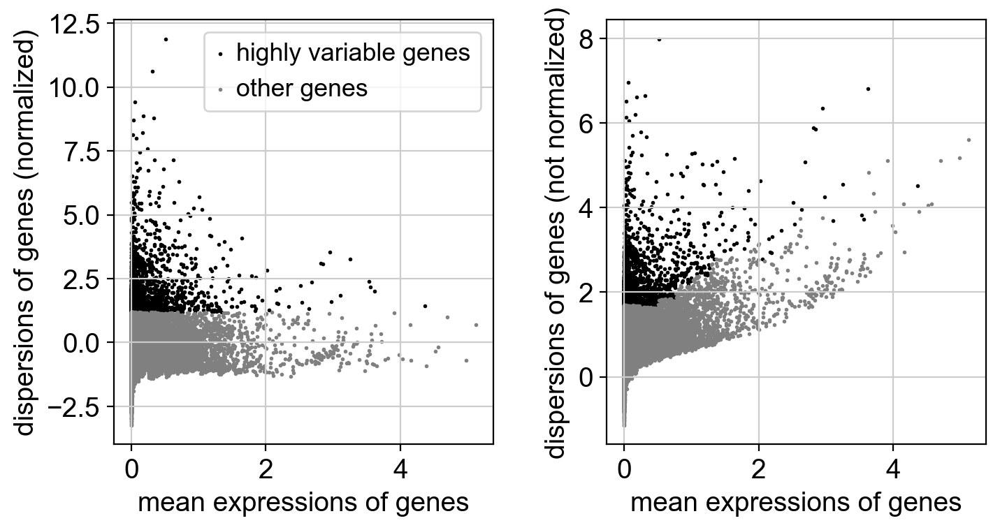

2000


AnnData object with n_obs × n_vars = 53548 × 20952
    obs: 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'log1p', 'hvg'

In [19]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
sc.pl.highly_variable_genes(adata)
print(sum(adata.var.highly_variable))
adata

In [20]:
adata.raw=adata

In [21]:
adata = adata[:, adata.var.highly_variable]
adata

View of AnnData object with n_obs × n_vars = 53548 × 2000
    obs: 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'log1p', 'hvg'

In [22]:
sc.pp.regress_out(adata, keys=['total_counts', 'pct_counts_mt','pct_counts_rpl','pct_counts_rps'], n_jobs=10)
sc.pp.scale(adata, max_value=10)
adata

regressing out ['total_counts', 'pct_counts_mt', 'pct_counts_rpl', 'pct_counts_rps']
    sparse input is densified and may lead to high memory use
    finished (0:00:11)


AnnData object with n_obs × n_vars = 53548 × 2000
    obs: 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'log1p', 'hvg'

In [23]:
sc.tl.pca(adata, svd_solver='arpack')
sce.pp.harmony_integrate(adata, key='batch', basis='X_pca', adjusted_basis='X_pca_harmony')
adata.obsm['X_pca']=adata.obsm['X_pca_harmony']
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40, knn=True)
sc.tl.leiden(adata, resolution=0.6, key_added = "leiden")
sc.tl.umap(adata)
adata

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:13)


2023-11-02 21:31:02,039 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-11-02 21:31:10,424 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-11-02 21:31:10,572 - harmonypy - INFO - Iteration 1 of 10
2023-11-02 21:31:18,311 - harmonypy - INFO - Iteration 2 of 10
2023-11-02 21:31:27,623 - harmonypy - INFO - Iteration 3 of 10
2023-11-02 21:31:36,023 - harmonypy - INFO - Iteration 4 of 10
2023-11-02 21:31:44,677 - harmonypy - INFO - Iteration 5 of 10
2023-11-02 21:31:51,687 - harmonypy - INFO - Iteration 6 of 10
2023-11-02 21:31:58,400 - harmonypy - INFO - Iteration 7 of 10
2023-11-02 21:34:52,319 - harmonypy - INFO - Iteration 8 of 10
2023-11-02 21:34:58,624 - harmonypy - INFO - Iteration 9 of 10
2023-11-02 21:35:02,557 - harmonypy - INFO - Iteration 10 of 10
2023-11-02 21:35:06,491 - harmonypy - INFO - Stopped before convergence


computing neighbors
    using 'X_pca' with n_pcs = 40


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)
running Leiden clustering
    finished: found 23 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:18)


AnnData object with n_obs × n_vars = 53548 × 2000
    obs: 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps', 'leiden'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


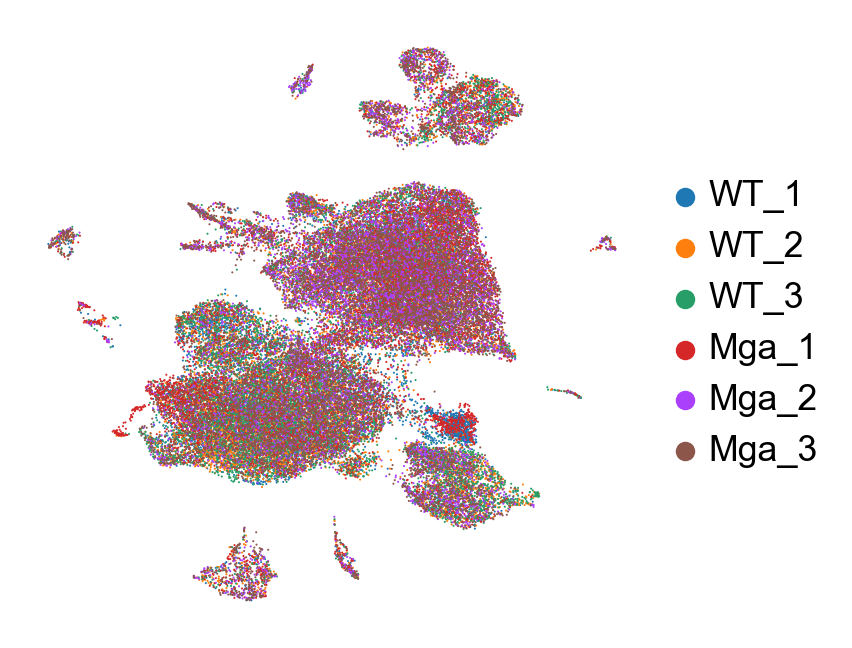

In [24]:
sc.pl.umap(adata, color=['batch'], legend_loc='right margin', frameon=False, title='', use_raw=True)

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


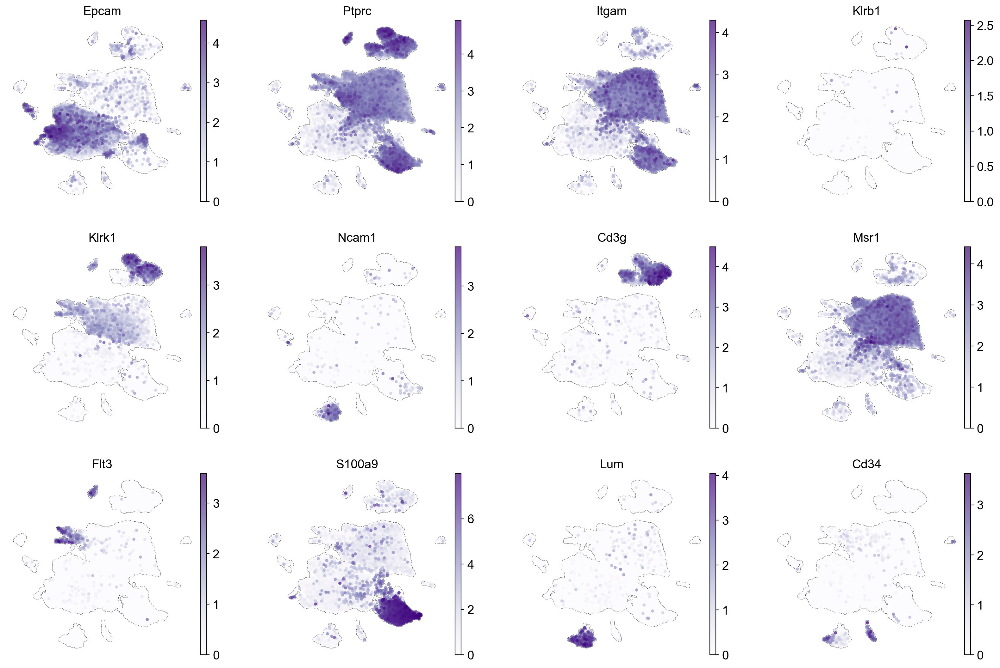

In [25]:
sc.pl.umap(adata, color=['Epcam','Ptprc','Itgam','Klrb1','Klrk1','Ncam1','Cd3g','Msr1','Flt3','S100a9','Lum','Cd34'], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples')

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


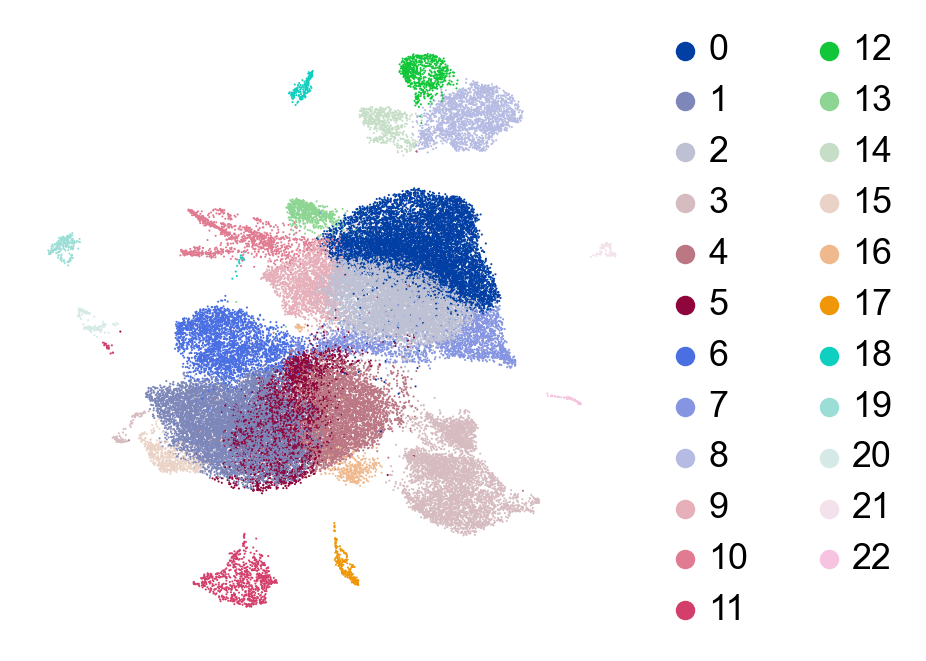

In [27]:
sc.pl.umap(adata, color=['leiden'], legend_loc='right margin', frameon=False, title='', use_raw=True)

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


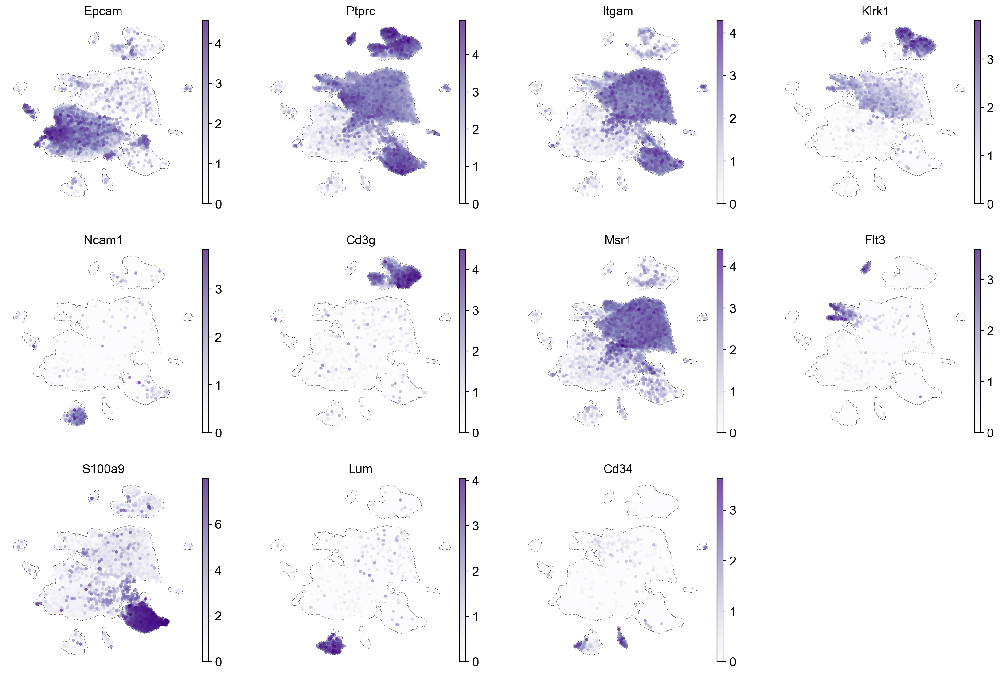

In [28]:
sc.pl.umap(adata, color=['Epcam','Ptprc','Itgam','Klrk1','Ncam1','Cd3g','Msr1','Flt3','S100a9','Lum','Cd34'], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples')

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


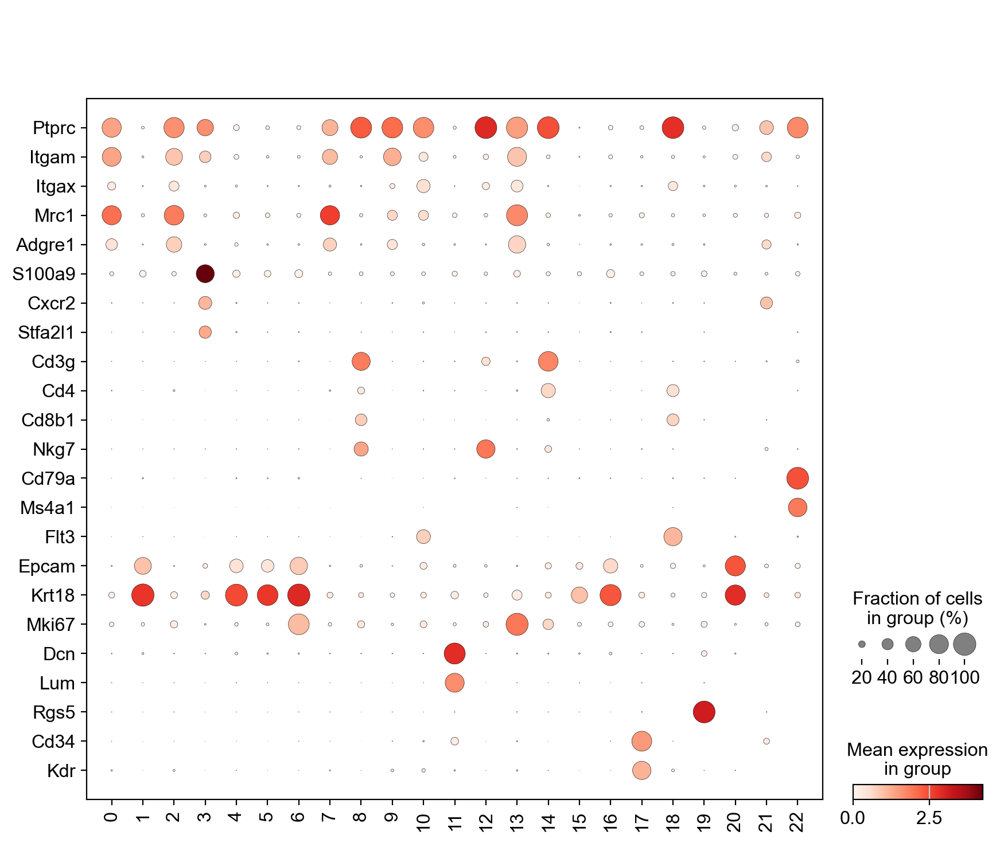

In [29]:
sc.pl.dotplot(adata, var_names=['Ptprc', 'Itgam','Itgax','Mrc1','Adgre1','S100a9','Cxcr2','Stfa2l1','Cd3g','Cd4','Cd8b1','Nkg7','Cd79a','Ms4a1','Flt3','Epcam','Krt18','Mki67','Dcn','Lum','Rgs5','Cd34','Kdr'], groupby='leiden', use_raw=True, var_group_rotation=0, vmin=0, swap_axes=True, dot_min=0)

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


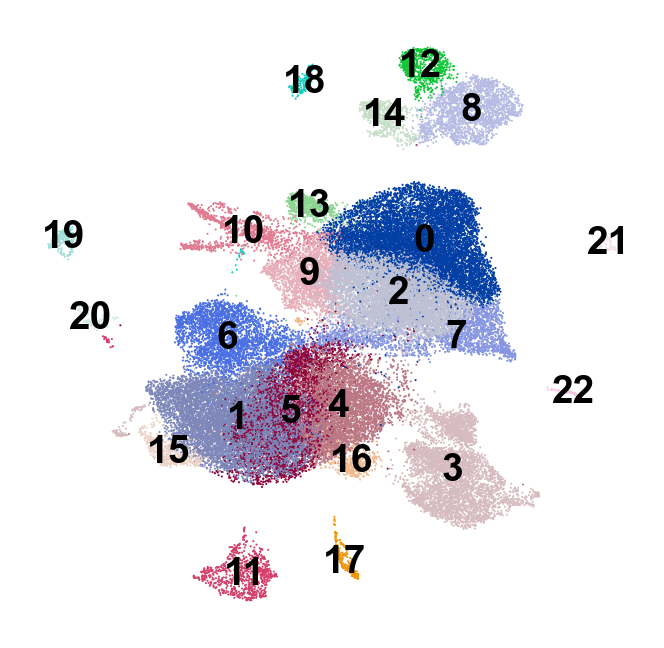

In [30]:
sc.pl.umap(adata, color=['leiden'], legend_loc='on data', frameon=False, title='', use_raw=True)

In [31]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method='wilcoxon', use_raw=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:17)


/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  se

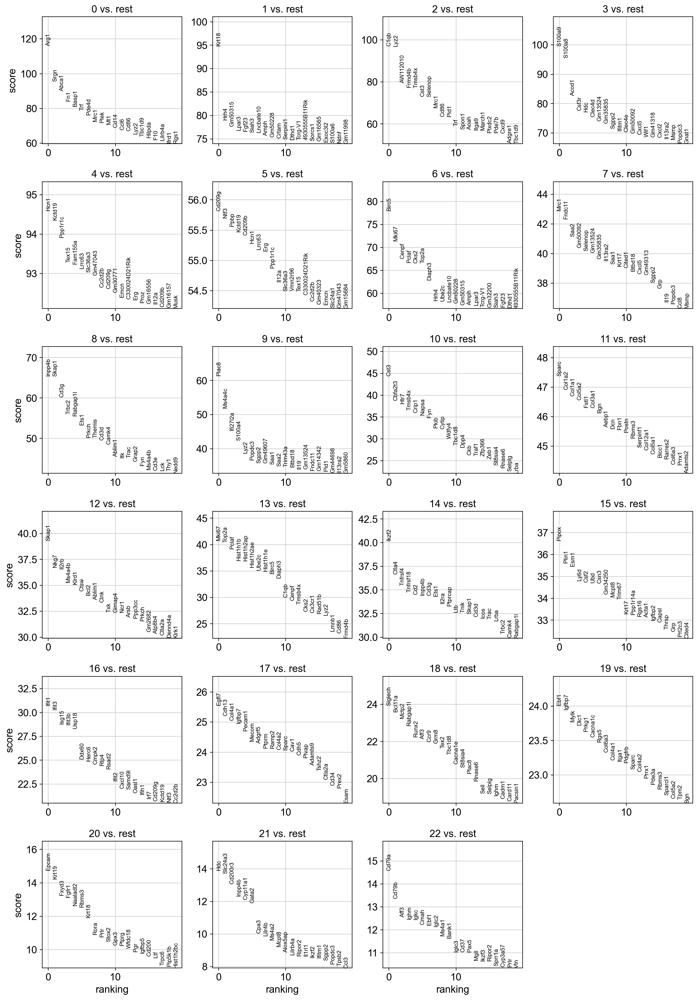

In [32]:
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

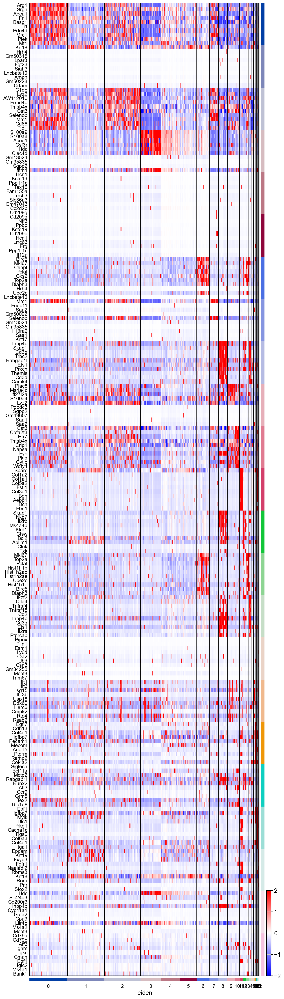

In [33]:
sc.pl.rank_genes_groups_heatmap(adata, n_genes=10, groupby='leiden', use_raw=False, swap_axes=True, show_gene_labels=True, vmin=-2, vmax=2, cmap='bwr', dendrogram=False)

In [34]:
# Supplementary Table
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
  {group + '_' + key[:3]: result[key][group]
    for group in groups for key in ['names', 'scores', 'logfoldchanges', 'pvals_adj']}).to_csv("/Users/fengxu/sc-RNA/Cluster_Markers_11022023.csv")

In [35]:
adata.write('/Users/fengxu/sc-RNA/all_HVGs_2000.h5ad', compression='gzip')

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


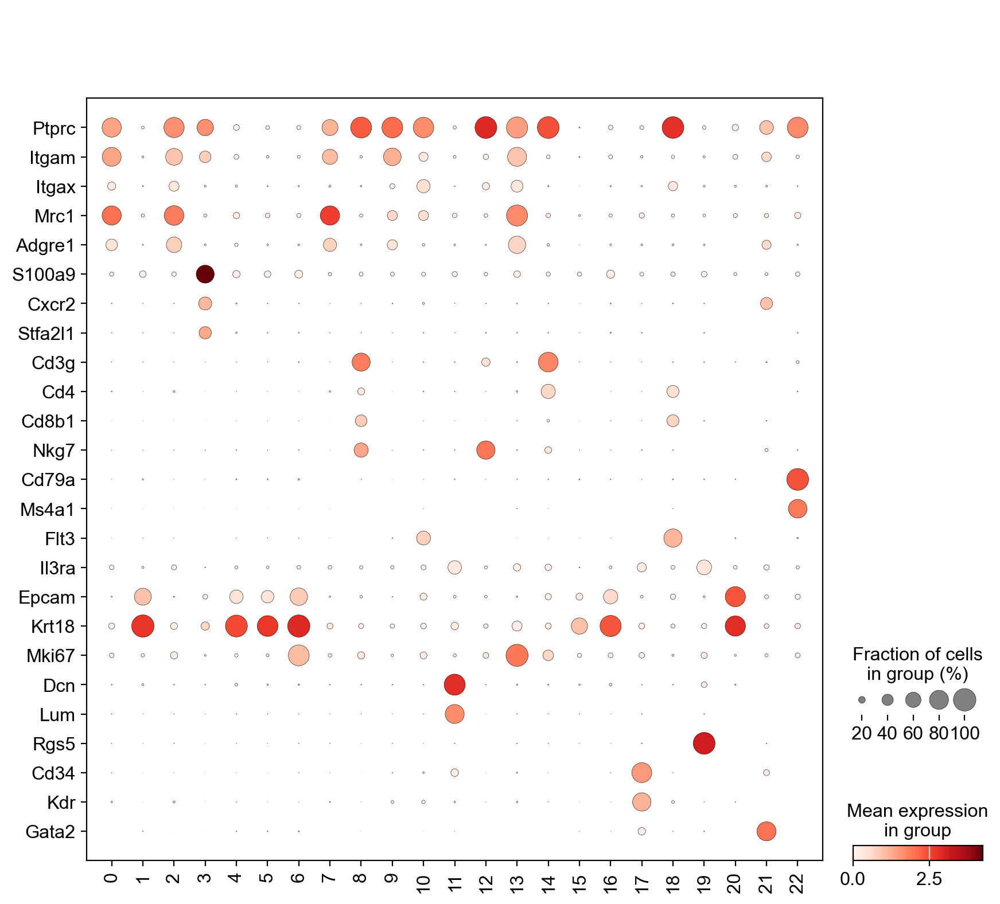

In [36]:
sc.pl.dotplot(adata, var_names=['Ptprc', 'Itgam','Itgax','Mrc1','Adgre1','S100a9','Cxcr2','Stfa2l1','Cd3g','Cd4','Cd8b1','Nkg7','Cd79a','Ms4a1','Flt3','Il3ra','Epcam','Krt18','Mki67','Dcn','Lum','Rgs5','Cd34','Kdr','Gata2'], groupby='leiden', use_raw=True, var_group_rotation=0, vmin=0, swap_axes=True, dot_min=0)

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


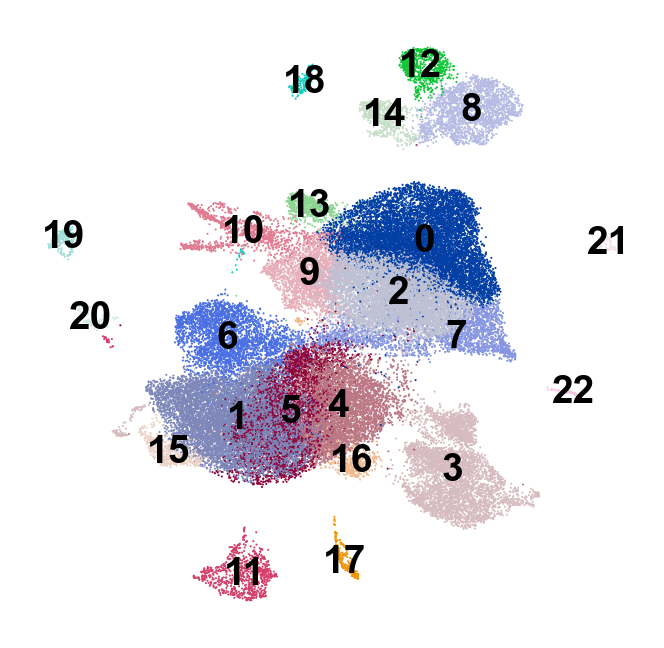

In [37]:
sc.pl.umap(adata, color=['leiden'], legend_loc='on data', frameon=False, title='', use_raw=True)

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


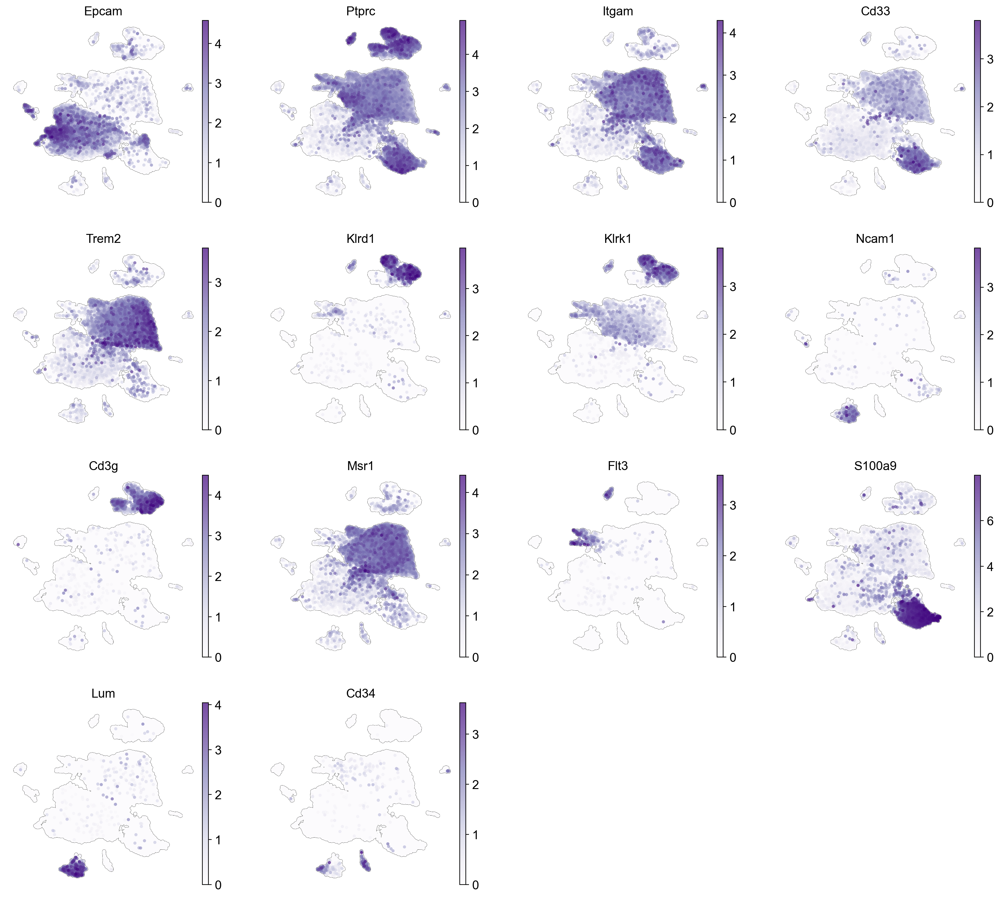

In [38]:
sc.pl.umap(adata, color=['Epcam','Ptprc','Itgam','Cd33','Trem2','Klrd1','Klrk1','Ncam1','Cd3g','Msr1','Flt3','S100a9','Lum','Cd34'], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples')

In [39]:
adata.obs['cell_type'] = (adata.obs['leiden'].map
                              (lambda x: {'0': 'Macrophages', '1': 'Tumor cells', '2': 'Macrophages', '3': 'Monocytes', '4':'Tumor cells', '5': 'Tumor cells',
                                          '6': 'Prolif Tumor cells', '7': 'Macrophages', '8': 'T cells', '9':'Macrophages',
                                          '10': 'cDCs', '11': 'Fibroblasts', '12': 'NKT cells', '13':'Prolif Macrophages', '14': 'T cells','15': 'Tumor cells','16': 'Tumor cells','17': 'Endothelial cells','18': 'pDCs','19':'Pericytes','20':'Tumor cells','21':'Macrophages','22':'B cells'}.get(x, x)).astype("category"))

In [40]:
adata.obs['cell_type'].cat.reorder_categories(['Tumor cells','Prolif Tumor cells','Macrophages','Prolif Macrophages','Monocytes','cDCs','pDCs','T cells','NKT cells','B cells','Fibroblasts','Endothelial cells','Pericytes'])

AAACCCAAGATCCCGC-1-WT_1     Prolif Macrophages
AAACCCACAAGGACAC-1-WT_1      Endothelial cells
AAACCCACATGTACGT-1-WT_1            Tumor cells
AAACCCAGTAGCCAGA-1-WT_1            Tumor cells
AAACCCAGTAGCTGCC-1-WT_1     Prolif Tumor cells
                                   ...        
TTTGTTGCAGTAGTTC-1-Mga_3             NKT cells
TTTGTTGGTTGCTAGT-1-Mga_3               T cells
TTTGTTGTCACTGGTA-1-Mga_3           Macrophages
TTTGTTGTCGTTCATT-1-Mga_3           Macrophages
TTTGTTGTCTTGGGCG-1-Mga_3           Macrophages
Name: cell_type, Length: 53548, dtype: category
Categories (13, object): ['Tumor cells', 'Prolif Tumor cells', 'Macrophages', 'Prolif Macrophages', ..., 'B cells', 'Fibroblasts', 'Endothelial cells', 'Pericytes']

/Users/fengxu/miniconda3/envs/sc-RNA/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


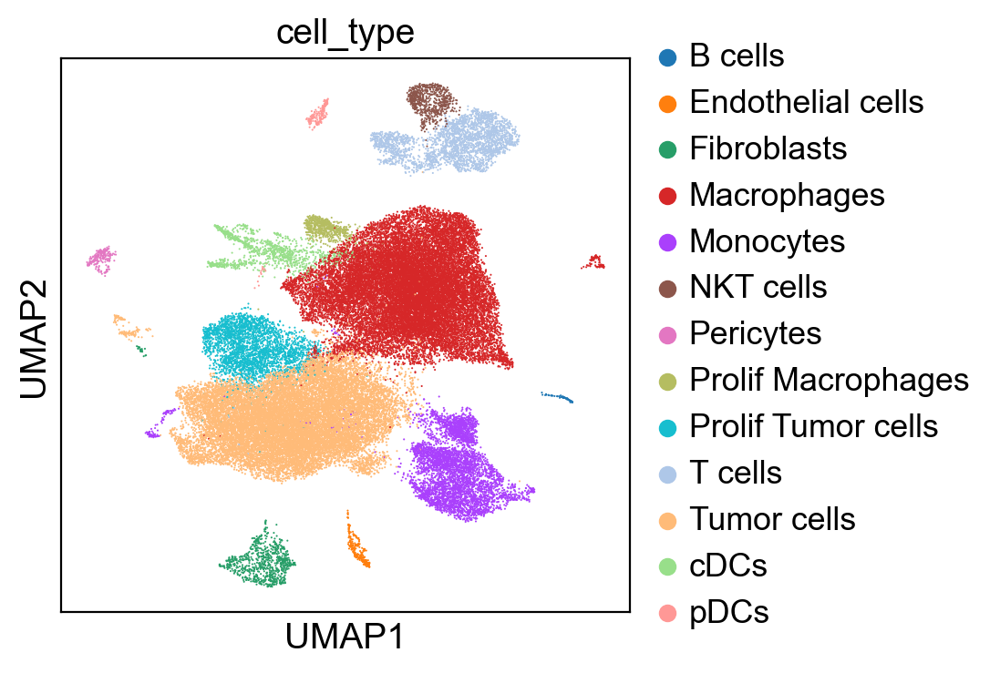

In [41]:
sc.pl.umap(adata, color=['cell_type'],legend_loc='right margin')

In [ ]:
sc.tl.rank_genes_groups(adata, groupby='cell_type', method='wilcoxon', use_raw=False)

In [ ]:
sc.pl.rank_genes_groups_heatmap(adata, n_genes=10, groupby='cell_type', use_raw=False, swap_axes=True, show_gene_labels=True, vmin=-2, vmax=2, cmap='bwr', dendrogram=False)

In [46]:
adata[adata.obs['batch']=='WT_1'].obs['cell_type'].value_counts()

cell_type
Tumor cells           3313
Macrophages           3127
Monocytes              932
Prolif Tumor cells     752
T cells                267
Prolif Macrophages     155
Fibroblasts             96
cDCs                    81
Endothelial cells       41
NKT cells               32
Pericytes               26
pDCs                    12
B cells                  4
Name: count, dtype: int64

In [47]:
adata[adata.obs['batch']=='WT_2'].obs['cell_type'].value_counts()

cell_type
Tumor cells           4262
Macrophages           3303
Monocytes              969
Prolif Tumor cells     601
T cells                491
Prolif Macrophages     147
cDCs                   134
Fibroblasts            117
NKT cells               93
Endothelial cells       38
Pericytes               19
pDCs                    14
B cells                  9
Name: count, dtype: int64

In [48]:
adata[adata.obs['batch']=='WT_3'].obs['cell_type'].value_counts()


cell_type
Tumor cells           3995
Macrophages           2636
Monocytes             1040
Prolif Tumor cells     791
T cells                595
cDCs                   126
NKT cells              111
Prolif Macrophages     107
Fibroblasts             79
B cells                 42
pDCs                    34
Endothelial cells       28
Pericytes               28
Name: count, dtype: int64

In [49]:
adata[adata.obs['batch']=='Mga_1'].obs['cell_type'].value_counts()


cell_type
Macrophages           4669
Tumor cells           2275
Monocytes              603
T cells                470
Prolif Tumor cells     283
cDCs                   199
Fibroblasts            155
NKT cells              141
Endothelial cells       61
Prolif Macrophages      52
Pericytes               25
pDCs                    16
B cells                  9
Name: count, dtype: int64

In [50]:
adata[adata.obs['batch']=='Mga_2'].obs['cell_type'].value_counts()


cell_type
Macrophages           3467
Tumor cells           1481
Monocytes              562
T cells                367
cDCs                   234
Prolif Tumor cells     217
Fibroblasts            144
NKT cells              144
Prolif Macrophages      93
pDCs                    85
Endothelial cells       30
Pericytes               27
B cells                  7
Name: count, dtype: int64

In [51]:
adata[adata.obs['batch']=='Mga_3'].obs['cell_type'].value_counts()

cell_type
Macrophages           4012
Tumor cells           2720
Monocytes              641
T cells                470
Prolif Tumor cells     310
cDCs                   302
Fibroblasts            204
NKT cells              164
Prolif Macrophages      94
Pericytes               75
pDCs                    48
Endothelial cells       39
B cells                  6
Name: count, dtype: int64

In [52]:
adata_T=adata[adata.obs['cell_type'].isin(['T cells'])]
adata_T

View of AnnData object with n_obs × n_vars = 2660 × 2000
    obs: 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps', 'leiden', 'cell_type'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'rank_genes_groups', 'cell_type_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [53]:
adata_T.write('/Users/fengxu/sc-RNA/adata_T_processed.h5ad', compression='gzip')

In [44]:
adata.write('/Users/fengxu/sc-RNA/WT_Mga_processed.h5ad', compression='gzip')
adata

AnnData object with n_obs × n_vars = 53548 × 2000
    obs: 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps', 'leiden', 'cell_type'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'rank_genes_groups', 'cell_type_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'